In [1]:
import tensorflow as tf
import numpy as np

from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Dropout 
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import concatenate

In [2]:
import os
import numpy as np 
import pandas as pd 

import imageio

import matplotlib.pyplot as plt
%matplotlib inline


In [3]:
import os
import cv2  # OpenCV for image loading

mask_path = r'C:\Users\bhara\Desktop\AIAss\UnzippedFiles\VOC2012_train_val\VOC2012_train_val\SegmentationClass'
image_path = r'C:\Users\bhara\Desktop\AIAss\UnzippedFiles\VOC2012_train_val\VOC2012_train_val\JPEGImages'
mask_list_orig = os.listdir(mask_path)

In [4]:
mask_list_orig = os.listdir(mask_path)
image_list_orig = [i[:-4] + ".jpg" for i in mask_list_orig]  # Assuming masks have a .png extension

# Full paths for images and masks
image_list = [os.path.join(image_path, i) for i in image_list_orig]
mask_list = [os.path.join(mask_path, i) for i in mask_list_orig]


C:\Users\bhara\AppData\Local\Temp\ipykernel_42456\2127741555.py:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_list[N])
C:\Users\bhara\AppData\Local\Temp\ipykernel_42456\2127741555.py:3: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  mask = imageio.imread(mask_list[N])


Text(0.5, 1.0, 'Segmentation')

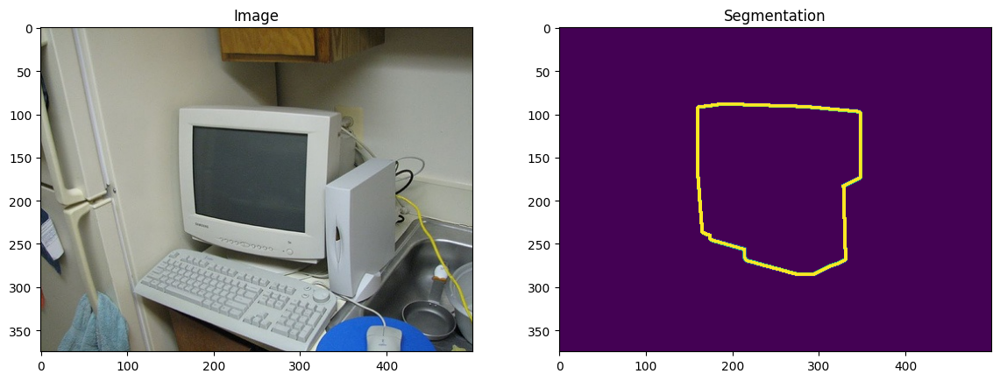

In [5]:
N = 2
img = imageio.imread(image_list[N])
mask = imageio.imread(mask_list[N])
#mask = np.array([max(mask[i, j]) for i in range(mask.shape[0]) for j in range(mask.shape[1])]).reshape(img.shape[0], img.shape[1])

fig, arr = plt.subplots(1, 2, figsize=(14, 10))
arr[0].imshow(img)
arr[0].set_title('Image')
arr[1].imshow(mask[:, :, 0])
arr[1].set_title('Segmentation')

In [6]:
image_list_ds = tf.data.Dataset.list_files(image_list, shuffle=False)
mask_list_ds = tf.data.Dataset.list_files(mask_list, shuffle=False)

for path in zip(image_list_ds.take(3), mask_list_ds.take(3)):
    print(path)

(<tf.Tensor: shape=(), dtype=string, numpy=b'C:\\Users\\bhara\\Desktop\\AIAss\\UnzippedFiles\\VOC2012_train_val\\VOC2012_train_val\\JPEGImages\\2007_000032.jpg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'C:\\Users\\bhara\\Desktop\\AIAss\\UnzippedFiles\\VOC2012_train_val\\VOC2012_train_val\\SegmentationClass\\2007_000032.png'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'C:\\Users\\bhara\\Desktop\\AIAss\\UnzippedFiles\\VOC2012_train_val\\VOC2012_train_val\\JPEGImages\\2007_000033.jpg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'C:\\Users\\bhara\\Desktop\\AIAss\\UnzippedFiles\\VOC2012_train_val\\VOC2012_train_val\\SegmentationClass\\2007_000033.png'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'C:\\Users\\bhara\\Desktop\\AIAss\\UnzippedFiles\\VOC2012_train_val\\VOC2012_train_val\\JPEGImages\\2007_000039.jpg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'C:\\Users\\bhara\\Desktop\\AIAss\\UnzippedFiles\\VOC2012_train_val\\VOC2012_train_val\\SegmentationClass\\2007_000039.png'>)


In [7]:
image_filenames = tf.constant(image_list)
masks_filenames = tf.constant(mask_list)

dataset = tf.data.Dataset.from_tensor_slices((image_filenames, masks_filenames))
# Shuffle the dataset while maintaining relative image and mask pairing
BUFFER_SIZE = len(image_list)  # Use the dataset length or a large buffer for effective shuffling

shuffled_dataset = dataset.shuffle(BUFFER_SIZE, seed=42, reshuffle_each_iteration=True)

# Take a sample and check if shuffling works (image-mask pairing is maintained)
for image, mask in shuffled_dataset.take(1):
    print("Shuffled image:", image)
    print("Shuffled mask:", mask)

Shuffled image: tf.Tensor(b'C:\\Users\\bhara\\Desktop\\AIAss\\UnzippedFiles\\VOC2012_train_val\\VOC2012_train_val\\JPEGImages\\2011_002064.jpg', shape=(), dtype=string)
Shuffled mask: tf.Tensor(b'C:\\Users\\bhara\\Desktop\\AIAss\\UnzippedFiles\\VOC2012_train_val\\VOC2012_train_val\\SegmentationClass\\2011_002064.png', shape=(), dtype=string)


In [8]:
mapping_keys = tf.constant([0, 64,128,192,224], dtype=tf.int32)
mapping_values = tf.constant([0, 1, 2,3,4], dtype=tf.int32)

def remap_mask(mask):
    mask = tf.squeeze(mask, axis=-1)  # Remove the last dimension
    mask = tf.cast(mask, dtype=tf.int32)  # Cast mask to int32

    # Create a boolean mask for known classes
    mask_shape = tf.shape(mask)
    remapped_mask = tf.zeros(mask_shape, dtype=tf.int32)  # Initialize remapped mask with zeros

    # Loop over each known class and assign the corresponding remapped value
    for i in range(len(mapping_keys)):
        remapped_mask = tf.where(mask == mapping_keys[i], mapping_values[i], remapped_mask)

    return tf.expand_dims(remapped_mask, axis=-1)  # Add back the last dimension




def process_path(image_path, mask_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_png(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=3)
    mask = tf.math.reduce_max(mask, axis=-1, keepdims=True)
    return img, mask

def preprocess(image, mask):
    input_image = tf.image.resize(image, (96, 128), method='nearest')
    input_mask = tf.image.resize(mask, (96, 128), method='nearest')
    input_mask=remap_mask(input_mask)
    return input_image, input_mask

image_ds = shuffled_dataset.map(process_path)
processed_image_ds = image_ds.map(preprocess)

In [9]:
def check_unique_mask_values(dataset):
    a=0
    for img, mask in dataset.take(2913):
        print("Unique mask values:", np.unique(mask.numpy()))
        a=max(a,len(np.unique(mask.numpy())))
    return a
b=check_unique_mask_values(processed_image_ds)
print(b)

Unique mask values: [0 2 3 4]
Unique mask values: [0 1 2 4]
Unique mask values: [0 2 3 4]
Unique mask values: [0 2 3 4]
Unique mask values: [0 2 4]
Unique mask values: [0 2 4]
Unique mask values: [0 2 4]
Unique mask values: [0 2 4]
Unique mask values: [0 2 3 4]
Unique mask values: [0 1 4]
Unique mask values: [0 2 4]
Unique mask values: [0 2 4]
Unique mask values: [3 4]
Unique mask values: [0 2 4]
Unique mask values: [0 1 4]
Unique mask values: [0 2 4]
Unique mask values: [0 2 4]
Unique mask values: [0 3 4]
Unique mask values: [0 2 4]
Unique mask values: [0 3 4]
Unique mask values: [0 2 4]
Unique mask values: [0 2 4]
Unique mask values: [0 2 4]
Unique mask values: [0 2 4]
Unique mask values: [0 2 4]
Unique mask values: [0 2 3 4]
Unique mask values: [0 2 4]
Unique mask values: [0 2 4]
Unique mask values: [0 2 4]
Unique mask values: [0 1 3 4]
Unique mask values: [0 3 4]
Unique mask values: [0 1 3 4]
Unique mask values: [0 3 4]
Unique mask values: [0 1 3 4]
Unique mask values: [0 2 3 4]
Un

In [10]:
for image, mask in processed_image_ds.take(6):
    print("Image shape:", image.shape)
    print("Mask shape:", mask.shape)


Image shape: (96, 128, 3)
Mask shape: (96, 128, 1)
Image shape: (96, 128, 3)
Mask shape: (96, 128, 1)
Image shape: (96, 128, 3)
Mask shape: (96, 128, 1)
Image shape: (96, 128, 3)
Mask shape: (96, 128, 1)
Image shape: (96, 128, 3)
Mask shape: (96, 128, 1)
Image shape: (96, 128, 3)
Mask shape: (96, 128, 1)


In [11]:
def conv_block(inputs=None, n_filters=32, dropout_prob=0, max_pooling=True):
    """
    Convolutional downsampling block
    """
    conv = Conv2D(n_filters, # Number of filters
                  3,   # Kernel size   
                  activation='relu',
                  padding='same',
                  kernel_initializer='he_normal')(inputs)
    conv = Conv2D(n_filters, # Number of filters
                  3,   # Kernel size
                  activation='relu',
                  padding='same',
                  # set 'kernel_initializer' same as above
                  kernel_initializer='he_normal')(conv)

    if dropout_prob > 0:
        conv = Dropout(dropout_prob)(conv)
        
        
    
    if max_pooling:
        next_layer = MaxPooling2D(pool_size=(2,2))(conv)
        
    else:
        next_layer = conv
        
    skip_connection = conv
    
    return next_layer, skip_connection

In [12]:
def upsampling_block(expansive_input, contractive_input, n_filters=32):
    """
    Convolutional upsampling block
    
    """
    
    up = Conv2DTranspose(
                 n_filters,    
                 3,    
                 strides=(2,2),
                 padding='same')(expansive_input)
    
    merge = concatenate([up, contractive_input], axis=3)
    conv = Conv2D(n_filters,   
                 3,     
                 activation='relu',
                 padding='same',
                 kernel_initializer='he_normal')(merge)
    conv = Conv2D(n_filters,  
                 3,   
                 activation='relu',
                 padding='same',
                  
                 kernel_initializer='he_normal')(conv)
    
    
    return conv

In [13]:
def unet_model(input_size=(96, 128, 3), n_filters=32, n_classes=5):
    """
    Unet model
    """
    inputs = Input(input_size)
    
    cblock1 = conv_block(inputs, n_filters)

    cblock2 = conv_block(cblock1[0], 2*n_filters)
    cblock3 = conv_block(cblock2[0], 4*n_filters)
    cblock4 = conv_block(cblock3[0], 8*n_filters, dropout_prob=0.3) 
    
    cblock5 = conv_block(cblock4[0], 16*n_filters, dropout_prob=0.3, max_pooling=False) 
    
    
    
    ublock6 = upsampling_block(cblock5[0], cblock4[1],  n_filters*8)
    
    ublock7 = upsampling_block(ublock6, cblock3[1],  n_filters*4)
    ublock8 = upsampling_block(ublock7, cblock2[1],  n_filters*2)
    ublock9 = upsampling_block(ublock8, cblock1[1],  n_filters)
    

    conv9 = Conv2D(n_filters,
                 3,
                 activation='relu',
                 padding='same',
                 
                 kernel_initializer='he_normal')(ublock9)

   
    conv10 = Conv2D(n_classes, 1, padding='same')(conv9)

    outputs = tf.keras.layers.Softmax()(conv10)  # Add softmax activation
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
  
    
 

    return model

In [14]:

img_height = 96
img_width = 128
num_channels = 3

unet = unet_model((img_height, img_width, num_channels))


In [15]:
unet.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 96, 128,   │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 96, 128,   │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 96, 128,   │      9,248 │ conv2d[0][0]      │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 48, 64,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 48, 64,    │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 48, 64,    │     36,928 │ conv2d_2[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 24, 32,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 24, 32,    │     73,856 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 24, 32,    │    147,584 │ conv2d_4[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 12, 16,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 12, 16,    │    295,168 │ max_pooling2d_2[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 12, 16,    │    590,080 │ conv2d_6[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 12, 16,    │          0 │ conv2d_7[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 6, 8, 256) │          0 │ dropout[0][0]     │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 6, 8, 512) │  1,180,160 │ max_pooling2d_3[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 6, 8, 512) │  2,359,808 │ conv2d_8[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 6, 8, 512) │          0 │ conv2d_9[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose    │ (None, 12, 16,    │  1,179,904 │ dropout_1[0][0] 

 Total params: 8,639,877 (32.96 MB)

 Trainable params: 8,639,877 (32.96 MB)

 Non-trainable params: 0 (0.00 B)

In [16]:
class MeanIoUWithArgmax(tf.keras.metrics.MeanIoU):
    def update_state(self, y_true, y_pred, sample_weight=None):
        # Convert predictions to integer class labels
        y_pred = tf.argmax(y_pred, axis=-1)  # Shape: [batch_size, height, width]
        super().update_state(y_true, y_pred, sample_weight)

NUM_CLASSES = 6
unet.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=[MeanIoUWithArgmax(num_classes=NUM_CLASSES)])

In [17]:
def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

(327, 500, 1)


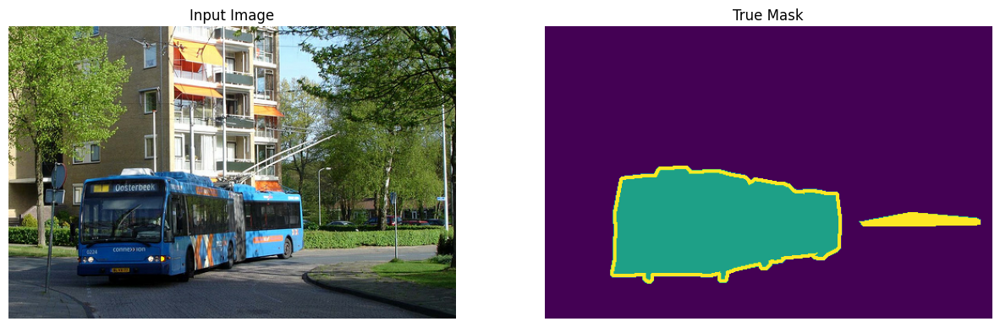

In [18]:
for image, mask in image_ds.take(1):
    sample_image, sample_mask = image, mask
    print(mask.shape)
display([sample_image, sample_mask])

In [19]:
EPOCHS = 25
VAL_SUBSPLITS = 5
BUFFER_SIZE = 500
BATCH_SIZE = 32
train_dataset = processed_image_ds.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
print(image_ds.element_spec)
model_history = unet.fit(train_dataset, epochs=EPOCHS)

(TensorSpec(shape=(None, None, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, None, 1), dtype=tf.uint8, name=None))
Epoch 1/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 159s 2s/step - loss: 1.7256 - mean_io_u_with_argmax: 0.1404
Epoch 2/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 153s 2s/step - loss: 0.9341 - mean_io_u_with_argmax: 0.1530
Epoch 3/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 153s 2s/step - loss: 0.8979 - mean_io_u_with_argmax: 0.1687
Epoch 4/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - loss: 0.8677 - mean_io_u_with_argmax: 0.1841
Epoch 5/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 137s 1s/step - loss: 0.8405 - mean_io_u_with_argmax: 0.1941
Epoch 6/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 135s 1s/step - loss: 0.8272 - mean_io_u_with_argmax: 0.1955
Epoch 7/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 136s 1s/step - loss: 0.8241 - mean_io_u_with_argmax: 0.2013
Epoch 8/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 136s 1s/step - loss: 0.8042 - mean_io_u_with_argmax: 0.2004
Epoch 9/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 135s 1s/step - loss: 0.7998 - mean_io_u_with_argmax

In [20]:
unet.save("./model2.keras")


In [21]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]

In [22]:
def show_predictions(dataset=None, num=1):
    """
    Displays the first image of each of the num batches
    """
    if dataset:
        for image, mask in dataset.take(num):
            pred_mask = unet.predict(image)
            display([image[0], mask[0], create_mask(pred_mask)])
    else:
        display([sample_image, sample_mask,
             create_mask(unet.predict(sample_image[tf.newaxis, ...]))])

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 693ms/step


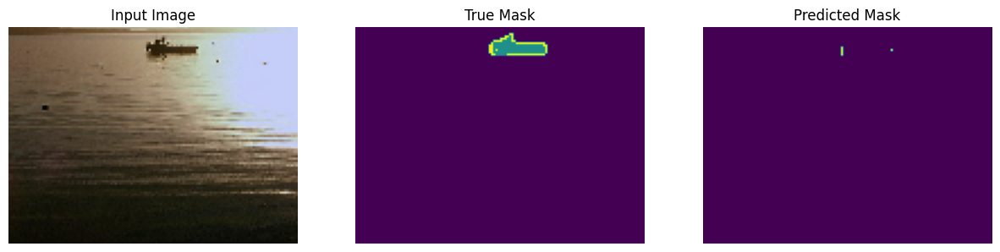

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


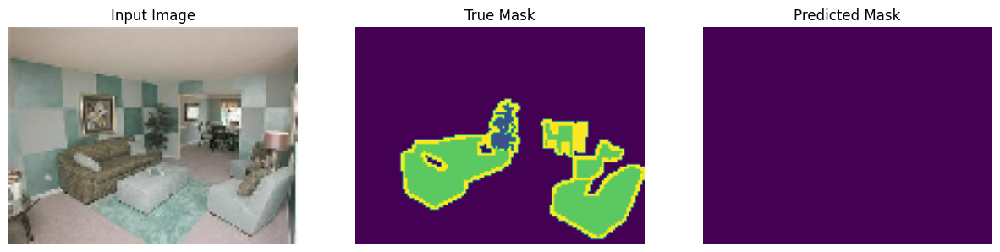

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


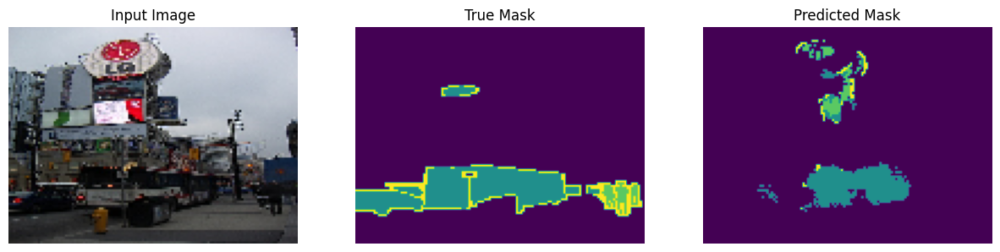

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


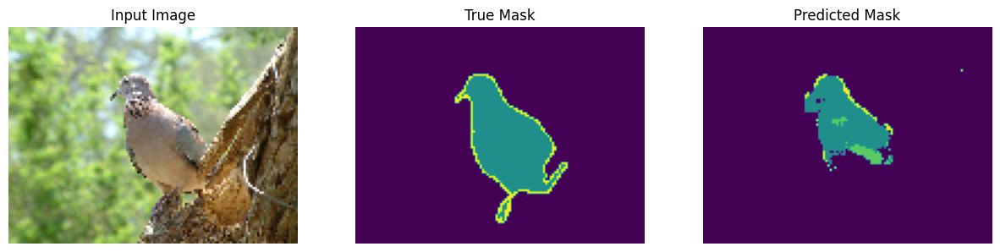

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


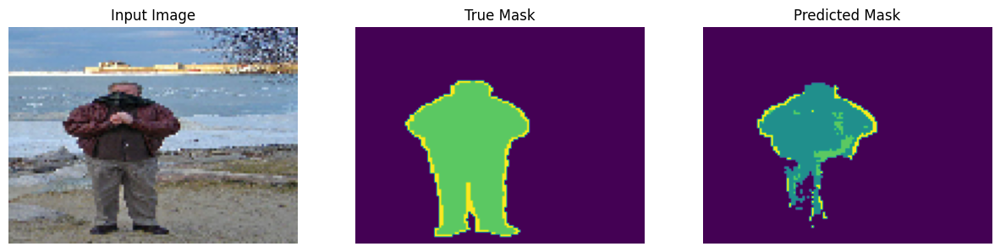

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


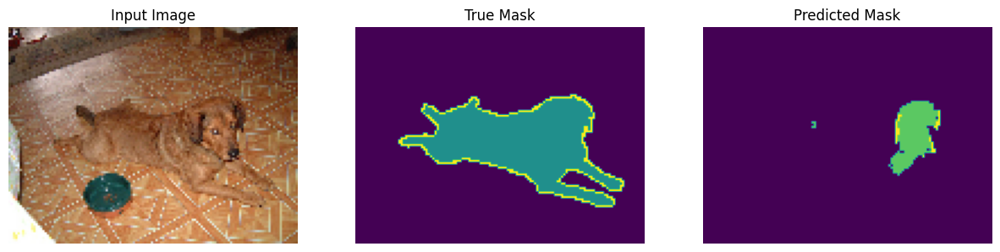

In [23]:
show_predictions(train_dataset, 6)

In [24]:
from tensorflow.keras.metrics import Metric
import tensorflow as tf

@tf.keras.utils.register_keras_serializable()
class MeanIoUWithArgmax(Metric):
    def __init__(self, num_classes, name='mean_io_u_with_argmax', dtype=None, **kwargs):
        super(MeanIoUWithArgmax, self).__init__(name=name, dtype=dtype)
        self.num_classes = num_classes
        self.mean_iou = tf.keras.metrics.MeanIoU(num_classes=num_classes)

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Assume y_pred has logits, apply argmax to get predicted classes
        y_pred = tf.argmax(y_pred, axis=-1)
        self.mean_iou.update_state(y_true, y_pred)

    def result(self):
        return self.mean_iou.result()

    def reset_state(self):
        self.mean_iou.reset_state()

    def get_config(self):
        config = super().get_config()
        config.update({
            'num_classes': self.num_classes
        })
        return config


In [25]:
from tensorflow.keras.models import load_model

# Assuming MeanIoUWithArgmax is the custom metric you used
custom_objects = {'MeanIoUWithArgmax': MeanIoUWithArgmax}

# Load the model, passing the custom objects
loaded_model = load_model('./model2.keras', custom_objects=custom_objects)


In [26]:
BUFFER_SIZE = 500
BATCH_SIZE = 32
train_dataset = processed_image_ds.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [27]:
def show_predictions(model, dataset=None, num=1):
    """
    Displays the first image of each of the num batches
    """
    if dataset:
        for image, mask in dataset.take(num):
            pred_mask = model.predict(image)
            display([image[0], mask[0], create_mask(pred_mask)])
    else:
        display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 678ms/step


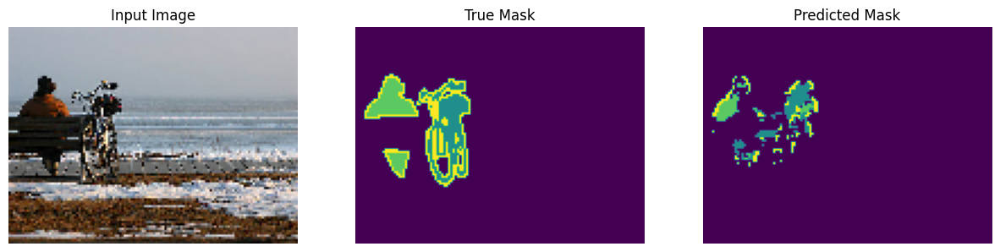

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


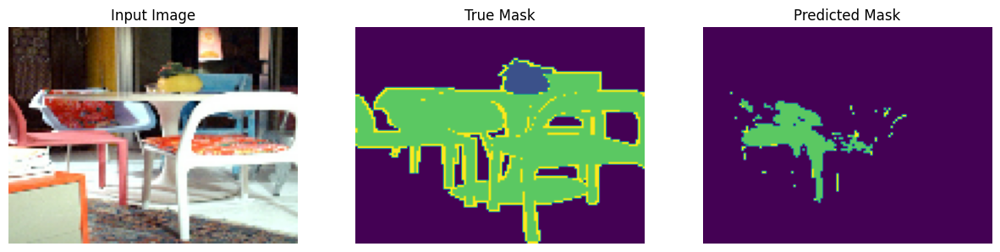

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


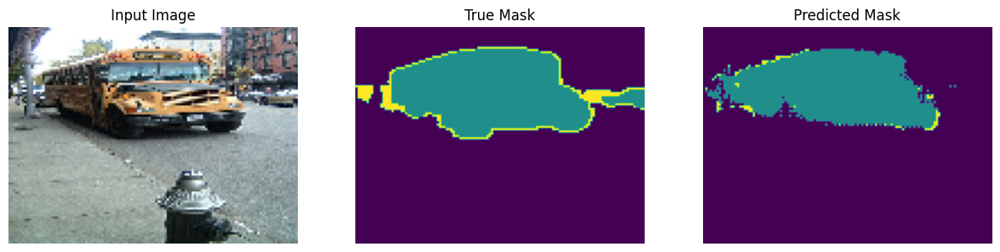

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


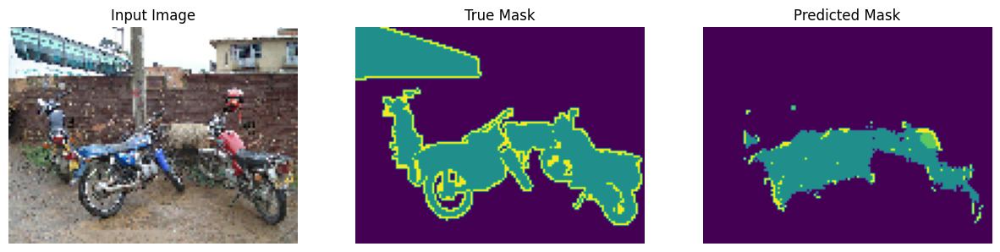

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


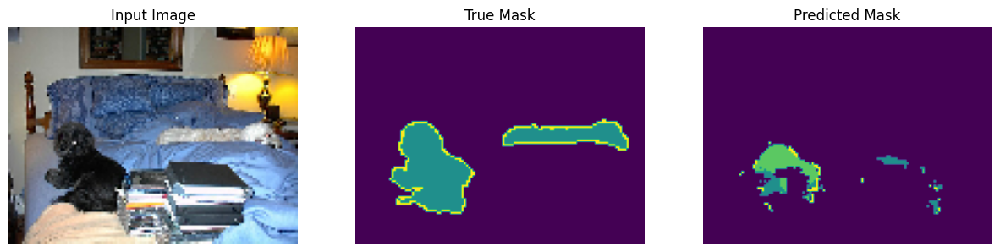

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


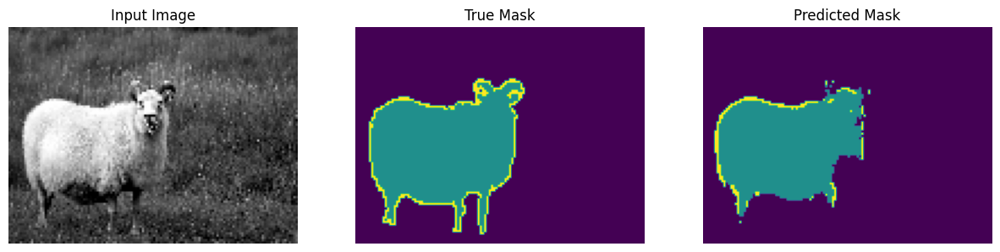

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


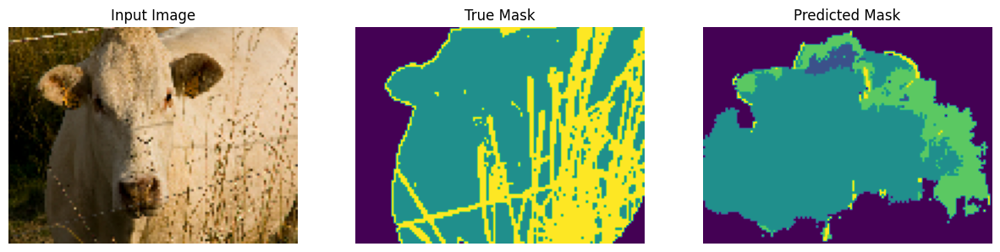

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


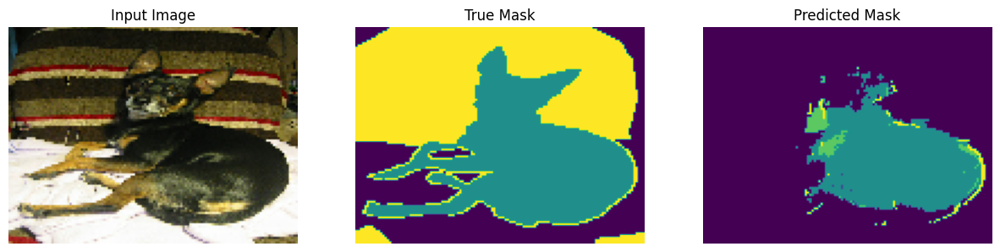

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


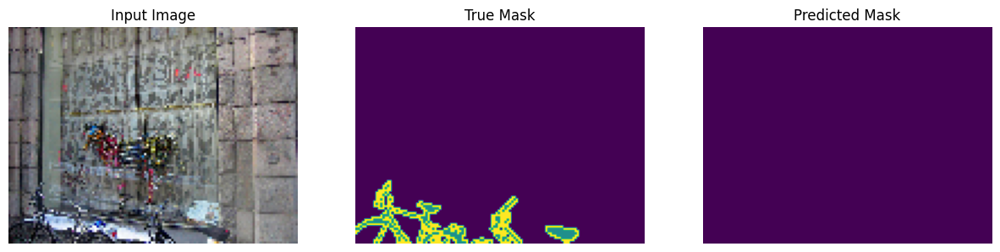

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


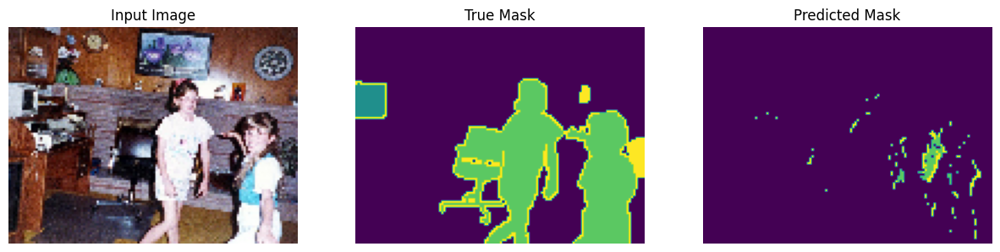

In [28]:
show_predictions(loaded_model,train_dataset,10)

In [29]:


# Split the dataset into 80% training and 20% validation
val_size = int(0.2 * len(list(processed_image_ds)))  # 20% validation
train_size = len(list(processed_image_ds)) - val_size  # 80% training

# Use `take` and `skip` to split the dataset
train_dataset = processed_image_ds.take(train_size)
val_dataset = processed_image_ds.skip(train_size)

# Shuffle, batch, and prefetch (for performance) both datasets
BATCH_SIZE = 32
BUFFER_SIZE = 500

train_dataset = train_dataset.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(buffer_size=tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(BATCH_SIZE).prefetch(buffer_size=tf.data.AUTOTUNE)


In [30]:
unet.compile(optimizer='adam',
             loss='sparse_categorical_crossentropy',
             metrics=[MeanIoUWithArgmax(num_classes=6)])

In [31]:
EPOCHS = 10  # Define how many epochs you want to train for

# Train the model and validate at each epoch
model_history = unet.fit(train_dataset, 
                         epochs=EPOCHS, 
                         validation_data=val_dataset)

Epoch 1/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 135s 2s/step - loss: 0.6680 - mean_io_u_with_argmax: 0.3039 - val_loss: 0.5236 - val_mean_io_u_with_argmax: 0.3657
Epoch 2/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 127s 2s/step - loss: 0.5669 - mean_io_u_with_argmax: 0.3490 - val_loss: 0.5160 - val_mean_io_u_with_argmax: 0.3934
Epoch 3/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 127s 2s/step - loss: 0.5548 - mean_io_u_with_argmax: 0.3756 - val_loss: 0.5266 - val_mean_io_u_with_argmax: 0.3962
Epoch 4/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 128s 2s/step - loss: 0.5347 - mean_io_u_with_argmax: 0.4017 - val_loss: 0.5418 - val_mean_io_u_with_argmax: 0.3926
Epoch 5/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 128s 2s/step - loss: 0.5239 - mean_io_u_with_argmax: 0.4032 - val_loss: 0.5361 - val_mean_io_u_with_argmax: 0.4245
Epoch 6/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 128s 2s/step - loss: 0.5123 - mean_io_u_with_argmax: 0.4199 - val_loss: 0.4997 - val_mean_io_u_with_argmax: 0.4495
Epoch 7/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 131s 2s/step - loss: 0.5043 - mean_io_u_with

In [32]:
unet.save("./model3.keras")

In [33]:
BUFFER_SIZE = 500
BATCH_SIZE = 32


In [34]:
custom_objects = {'MeanIoUWithArgmax': MeanIoUWithArgmax}

# Load the model, passing the custom objects
loaded_model_1 = load_model('./model3.keras', custom_objects=custom_objects)


In [35]:
def show_predictions(model, dataset=None, num=1):
    """
    Displays the first image of each of the num batches
    """
    if dataset:
        for image, mask in dataset.take(num):
            pred_mask = model.predict(image)
            display([image[0], mask[0], create_mask(pred_mask)])
    else:
        display([sample_image, sample_mask,
             create_mask(unet.predict(sample_image[tf.newaxis, ...]))])

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step


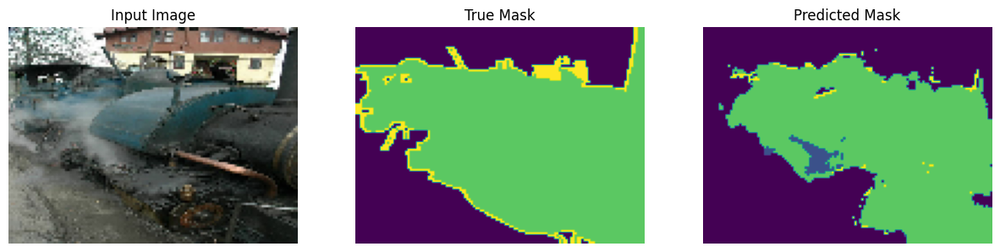

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


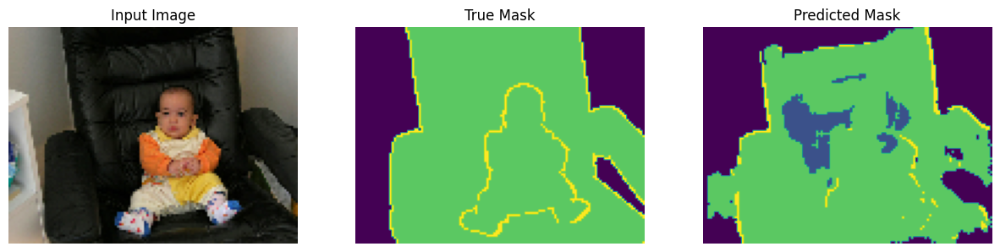

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


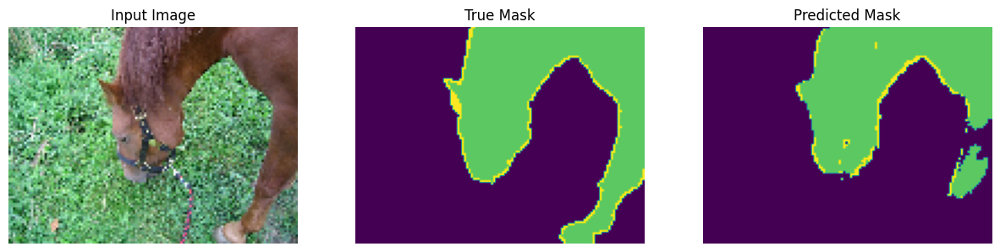

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


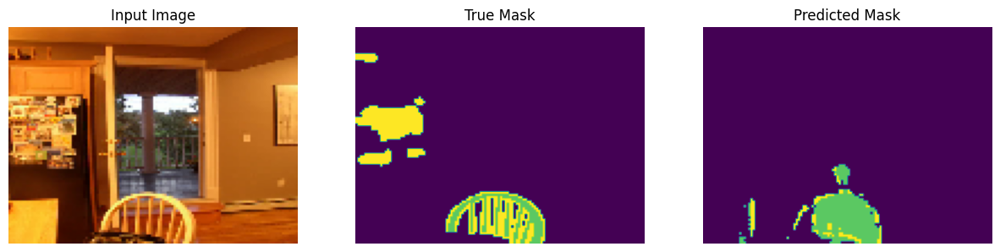

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


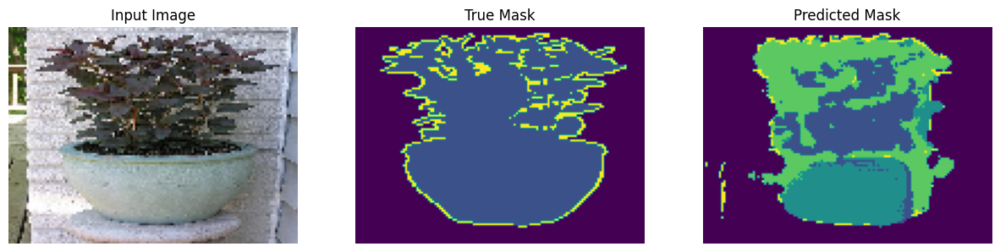

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


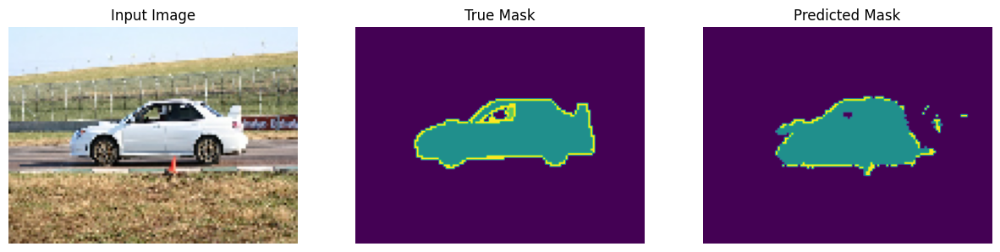

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


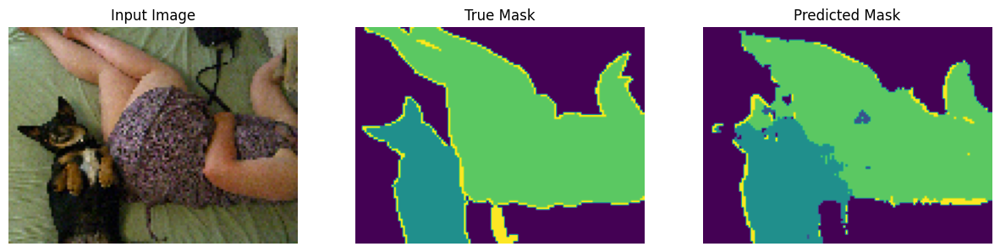

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


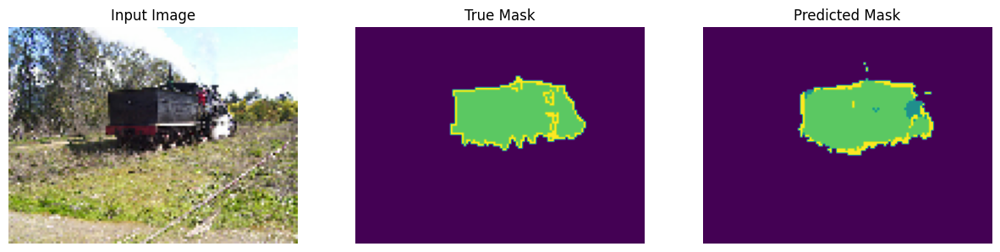

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


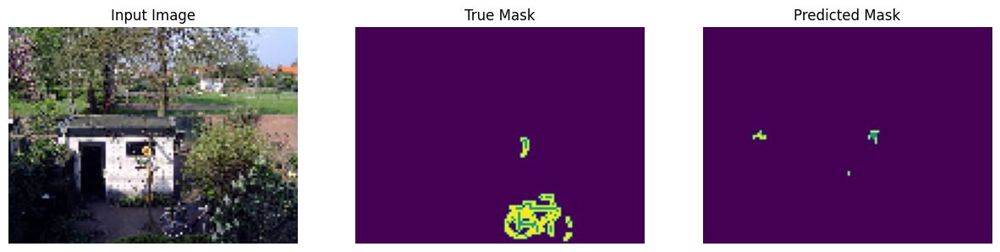

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


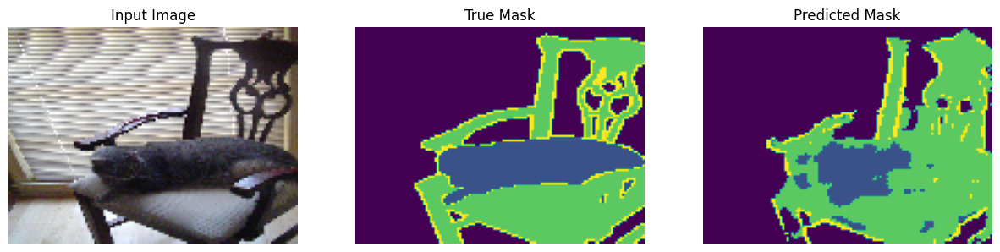

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


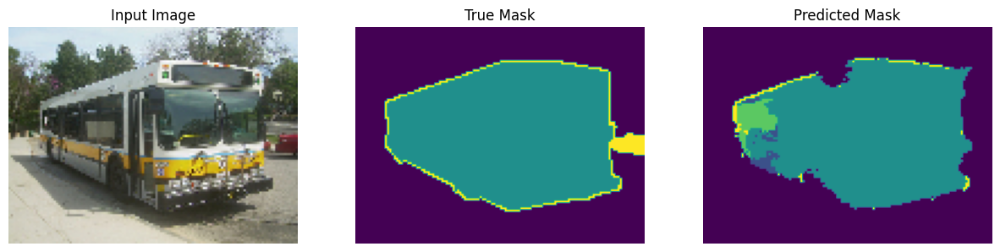

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


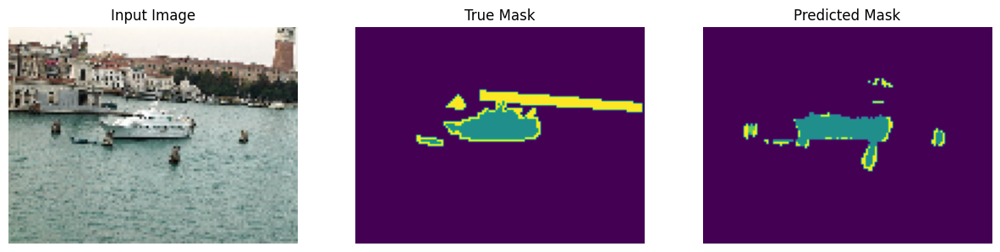

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


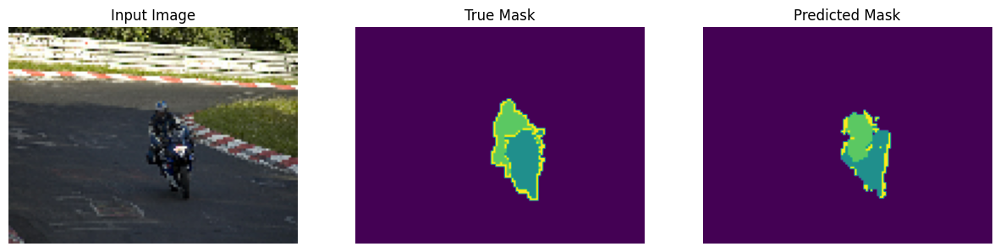

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


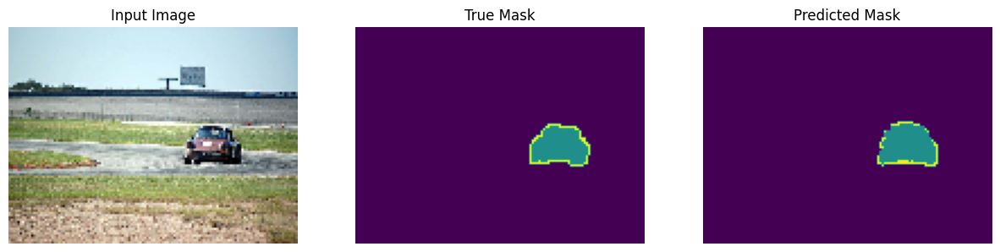

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


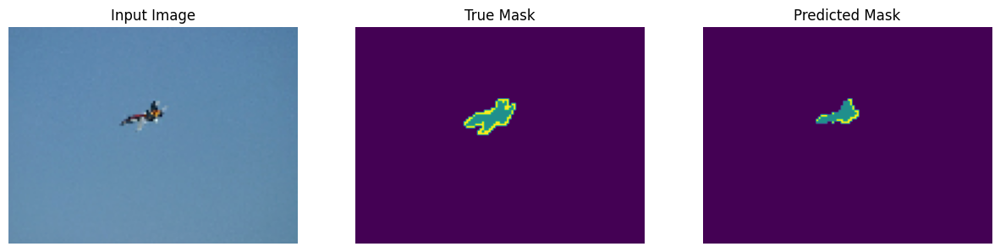

In [36]:
show_predictions(loaded_model_1,train_dataset, 15)

In [37]:
unet.compile(optimizer='adam',
             loss='sparse_categorical_crossentropy',
             metrics=[MeanIoUWithArgmax(num_classes=5)])

In [38]:
EPOCHS = 30  # Define how many epochs you want to train for

# Train the model and validate at each epoch
model_history = unet.fit(train_dataset, 
                         epochs=EPOCHS, 
                         validation_data=val_dataset)

Epoch 1/30
73/73 ━━━━━━━━━━━━━━━━━━━━ 133s 2s/step - loss: 0.4509 - mean_io_u_with_argmax: 0.4738 - val_loss: 0.4606 - val_mean_io_u_with_argmax: 0.4897
Epoch 2/30
73/73 ━━━━━━━━━━━━━━━━━━━━ 128s 2s/step - loss: 0.4075 - mean_io_u_with_argmax: 0.5045 - val_loss: 0.4319 - val_mean_io_u_with_argmax: 0.5167
Epoch 3/30
73/73 ━━━━━━━━━━━━━━━━━━━━ 129s 2s/step - loss: 0.3796 - mean_io_u_with_argmax: 0.5356 - val_loss: 0.3839 - val_mean_io_u_with_argmax: 0.5362
Epoch 4/30
73/73 ━━━━━━━━━━━━━━━━━━━━ 127s 2s/step - loss: 0.3647 - mean_io_u_with_argmax: 0.5445 - val_loss: 0.4276 - val_mean_io_u_with_argmax: 0.5219
Epoch 5/30
73/73 ━━━━━━━━━━━━━━━━━━━━ 128s 2s/step - loss: 0.3669 - mean_io_u_with_argmax: 0.5483 - val_loss: 0.3991 - val_mean_io_u_with_argmax: 0.5465
Epoch 6/30
73/73 ━━━━━━━━━━━━━━━━━━━━ 127s 2s/step - loss: 0.3504 - mean_io_u_with_argmax: 0.5657 - val_loss: 0.4184 - val_mean_io_u_with_argmax: 0.5353
Epoch 7/30
73/73 ━━━━━━━━━━━━━━━━━━━━ 127s 2s/step - loss: 0.3389 - mean_io_u_with

In [39]:
unet.save("./model4.keras")


In [40]:
custom_objects = {'MeanIoUWithArgmax': MeanIoUWithArgmax}

# Load the model, passing the custom objects
loaded_model_2 = load_model('./model4.keras', custom_objects=custom_objects)


In [41]:
def show_predictions(model, dataset=None, num=1):
    """
    Displays the first image of each of the num batches
    """
    if dataset:
        for image, mask in dataset.take(num):
            pred_mask = model.predict(image)
            display([image[0], mask[0], create_mask(pred_mask)])
    else:
        display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 589ms/step


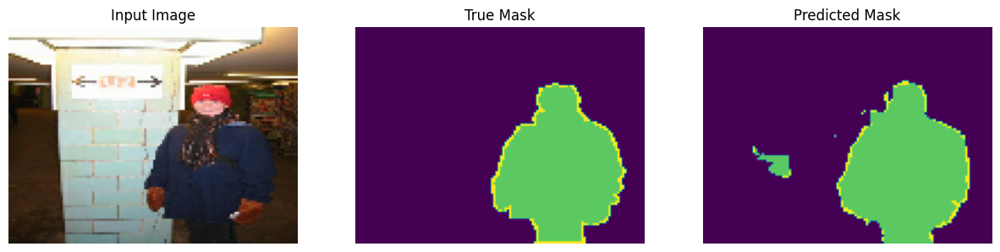

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


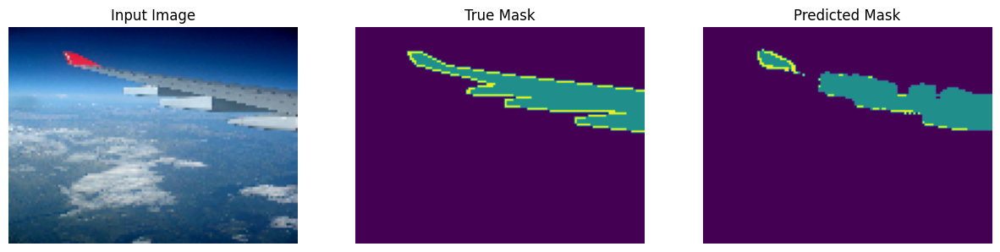

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


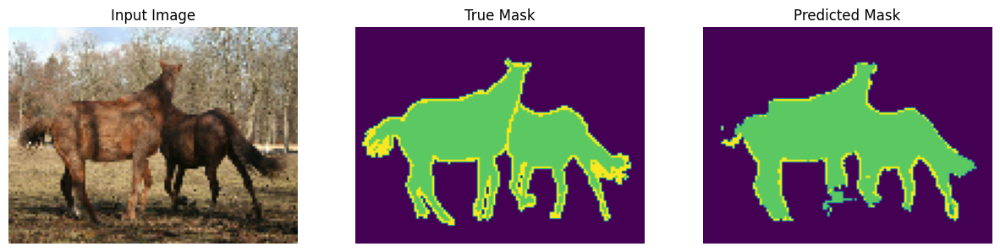

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


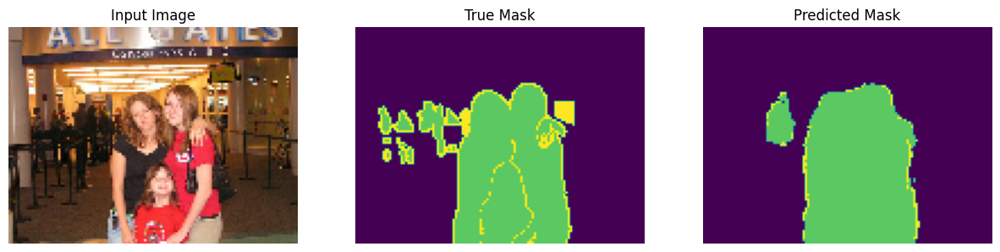

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


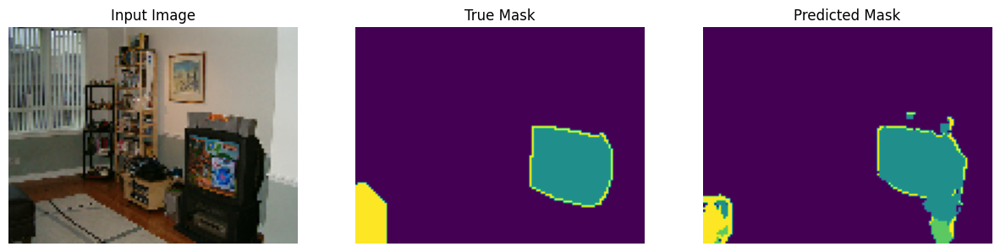

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


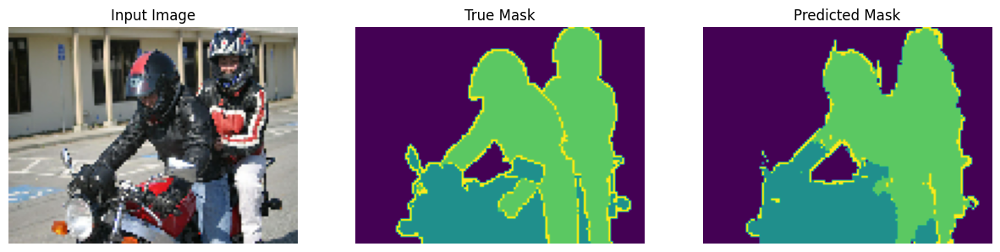

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


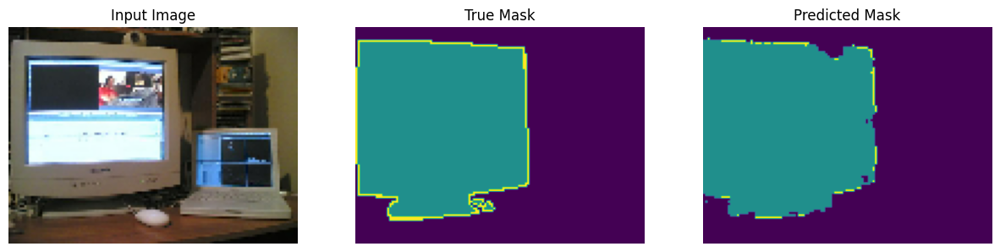

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


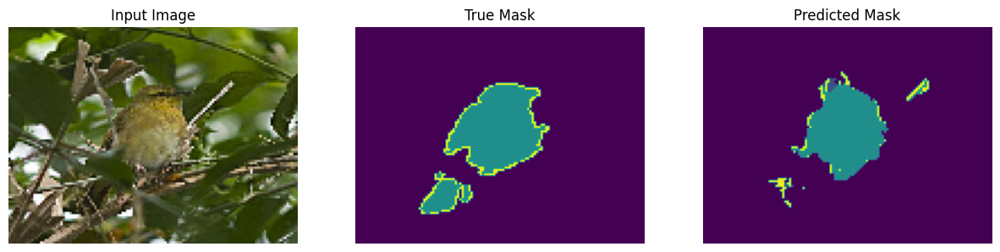

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


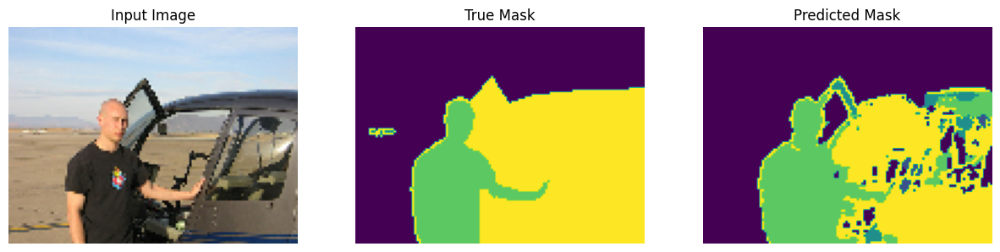

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


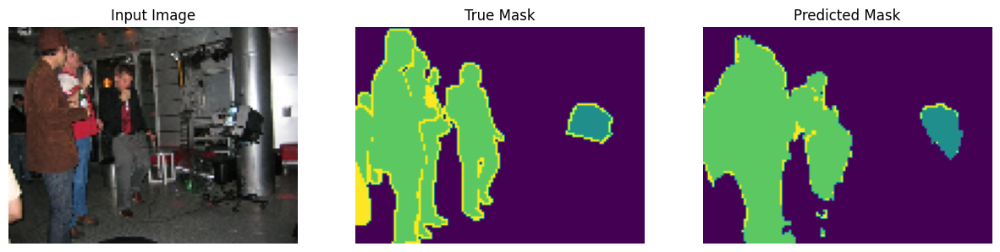

In [42]:
show_predictions(loaded_model_2,train_dataset, 10)

In [43]:
EPOCHS = 50  # Define how many epochs you want to train for

# Train the model and validate at each epoch
model_history = unet.fit(train_dataset, 
                         epochs=EPOCHS, 
                         validation_data=val_dataset)

Epoch 1/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 129s 2s/step - loss: 0.1917 - mean_io_u_with_argmax: 0.7429 - val_loss: 0.3449 - val_mean_io_u_with_argmax: 0.6591
Epoch 2/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 127s 2s/step - loss: 0.1907 - mean_io_u_with_argmax: 0.7434 - val_loss: 0.3178 - val_mean_io_u_with_argmax: 0.6642
Epoch 3/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 127s 2s/step - loss: 0.1833 - mean_io_u_with_argmax: 0.7499 - val_loss: 0.3475 - val_mean_io_u_with_argmax: 0.6661
Epoch 4/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 128s 2s/step - loss: 0.1860 - mean_io_u_with_argmax: 0.7498 - val_loss: 0.3107 - val_mean_io_u_with_argmax: 0.6836
Epoch 5/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 133s 2s/step - loss: 0.1838 - mean_io_u_with_argmax: 0.7473 - val_loss: 0.3332 - val_mean_io_u_with_argmax: 0.6621
Epoch 6/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 128s 2s/step - loss: 0.1849 - mean_io_u_with_argmax: 0.7475 - val_loss: 0.2949 - val_mean_io_u_with_argmax: 0.6812
Epoch 7/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 127s 2s/step - loss: 0.1703 - mean_io_u_with

In [44]:
unet.save("./model5.keras")

In [45]:
from tensorflow.keras.models import load_model

# Assuming MeanIoUWithArgmax is the custom metric you used
custom_objects = {'MeanIoUWithArgmax': MeanIoUWithArgmax}

# Load the model, passing the custom objects
loaded_model_3 = load_model('./model5.keras', custom_objects=custom_objects)


In [46]:
def show_predictions(model, dataset=None, num=1):
    """
    Displays the first image of each of the num batches
    """
    if dataset:
        for image, mask in dataset.take(num):
            pred_mask = model.predict(image)
            display([image[0], mask[0], create_mask(pred_mask)])
    else:
        display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


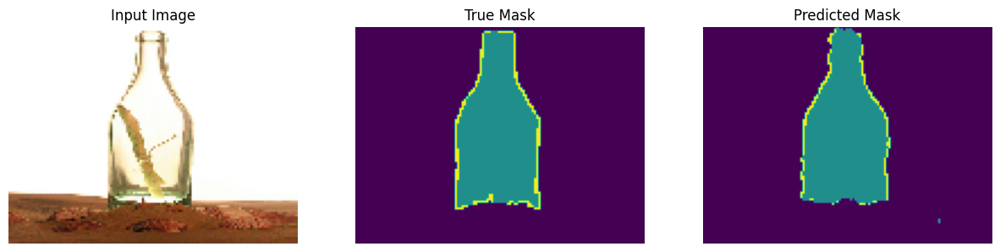

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


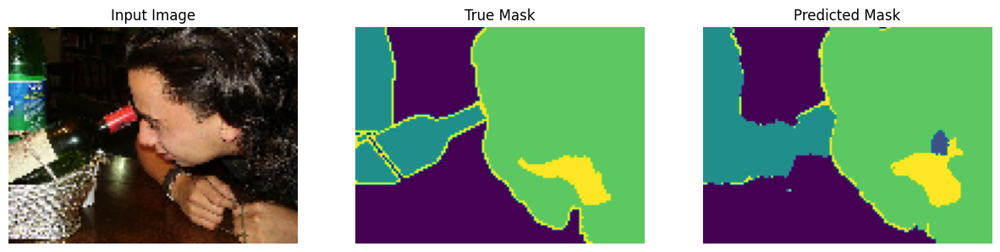

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


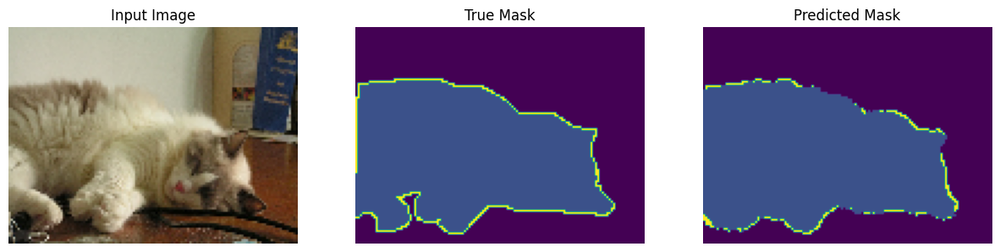

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


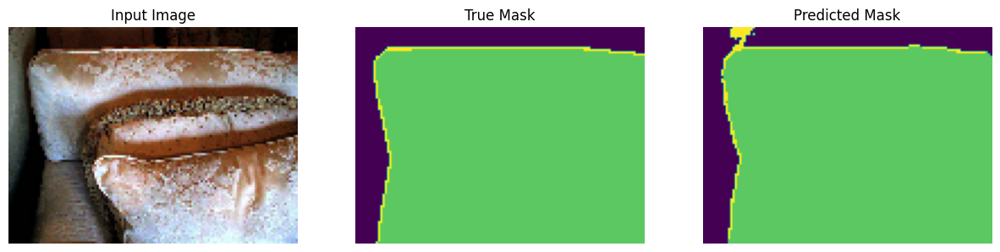

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


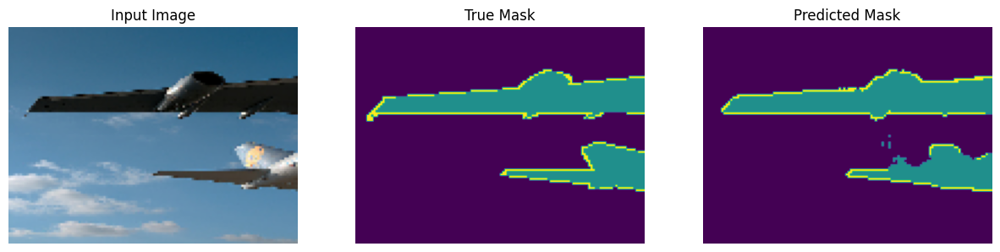

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


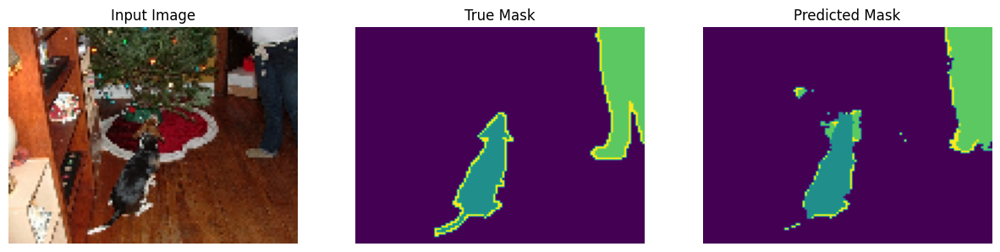

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


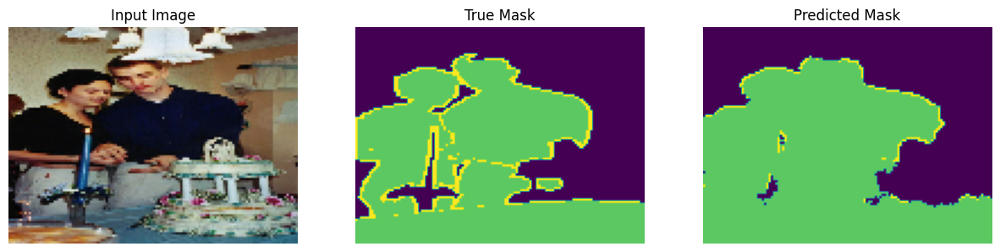

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


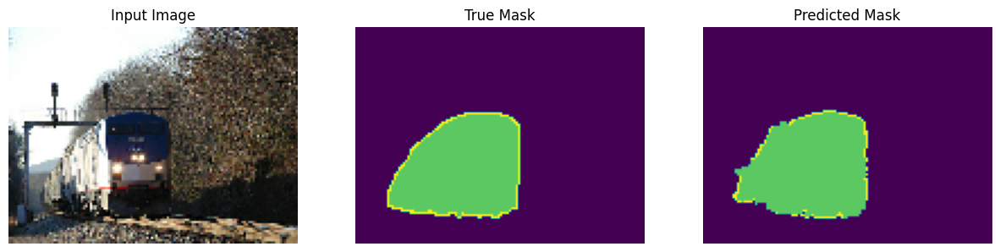

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


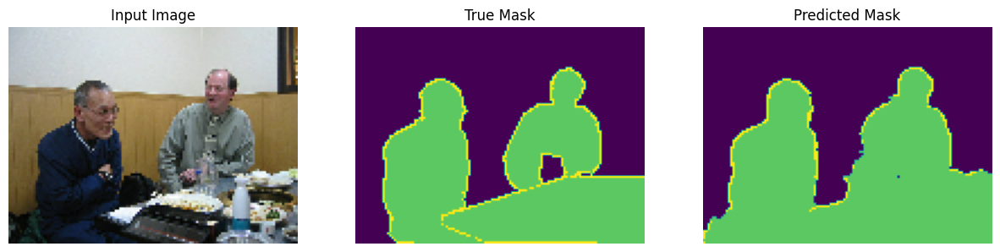

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


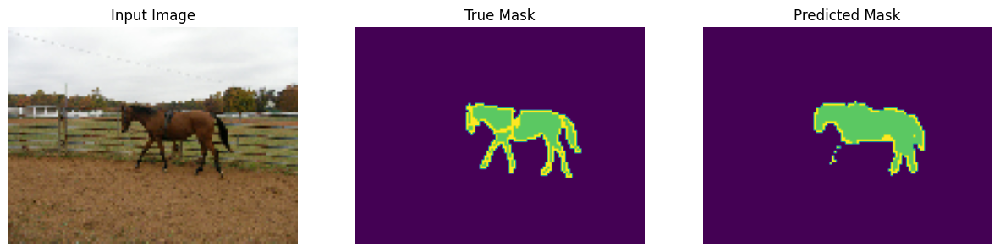

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


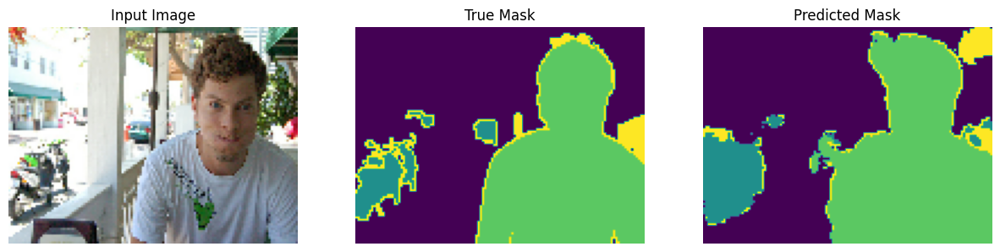

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


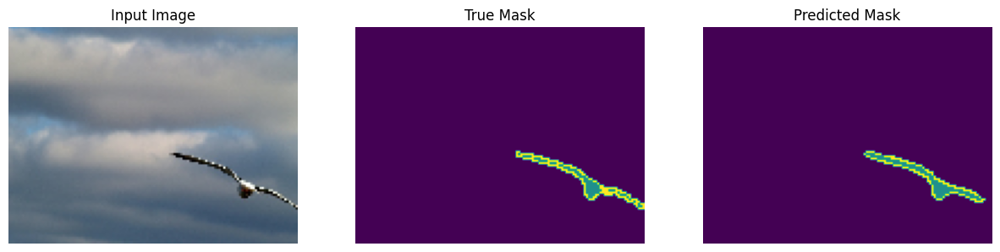

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


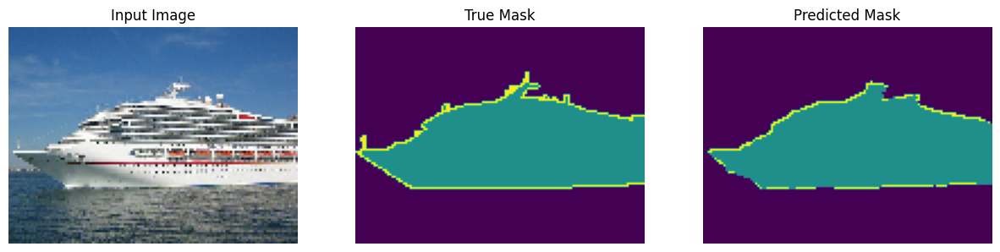

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


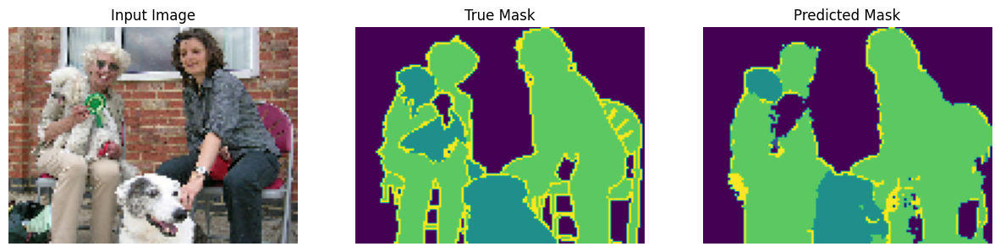

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


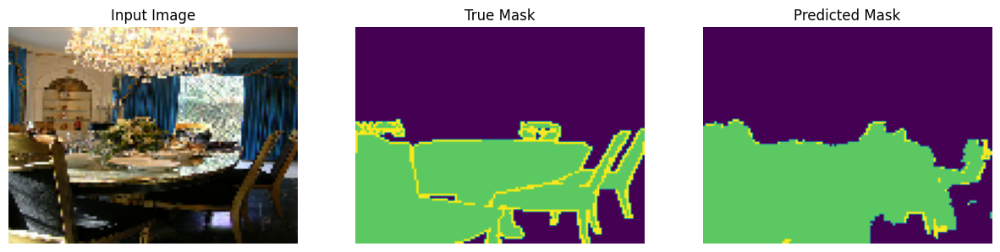

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


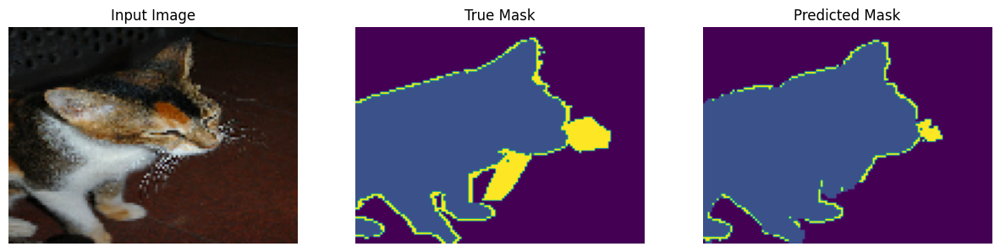

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


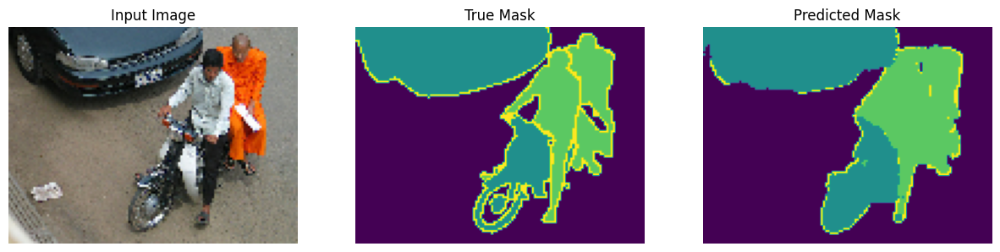

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


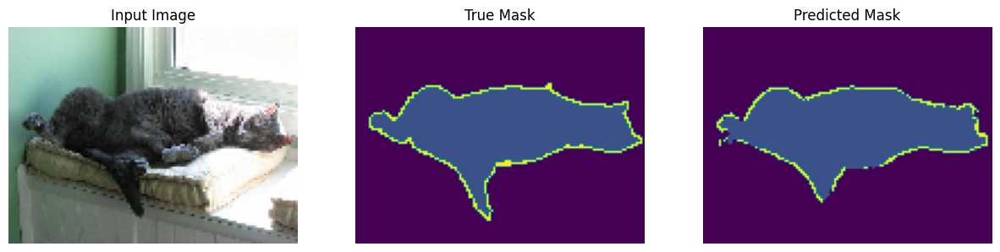

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


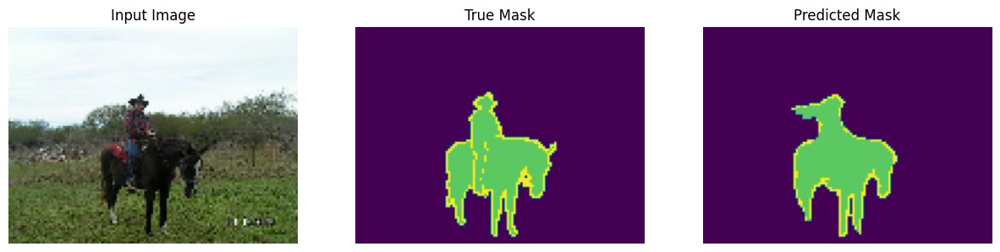

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


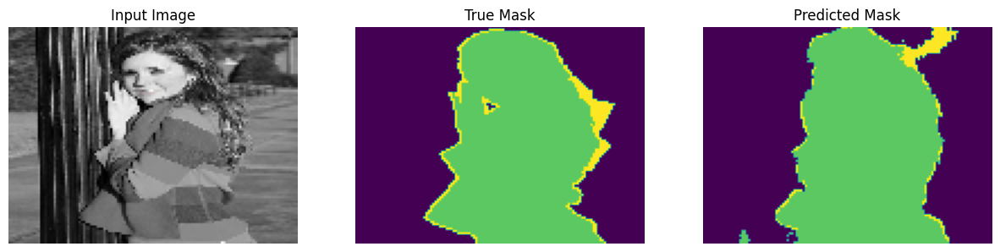

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


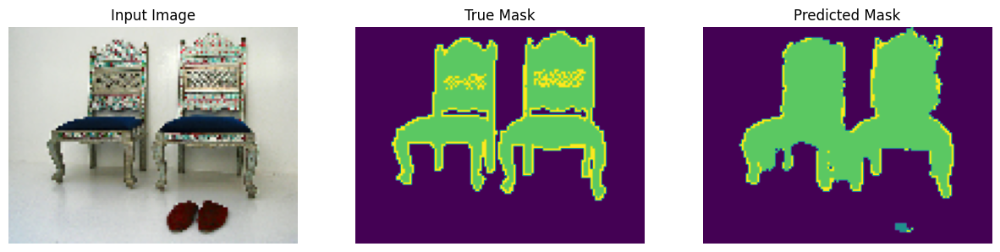

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


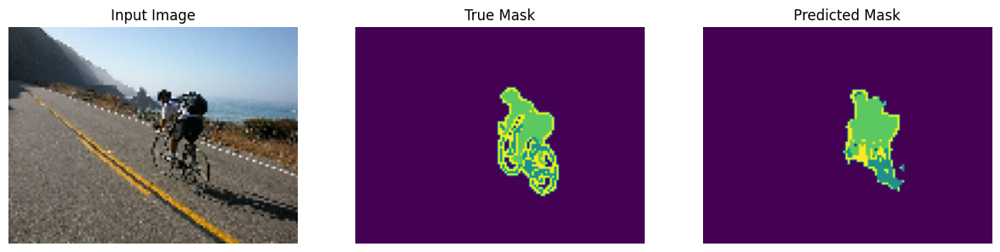

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


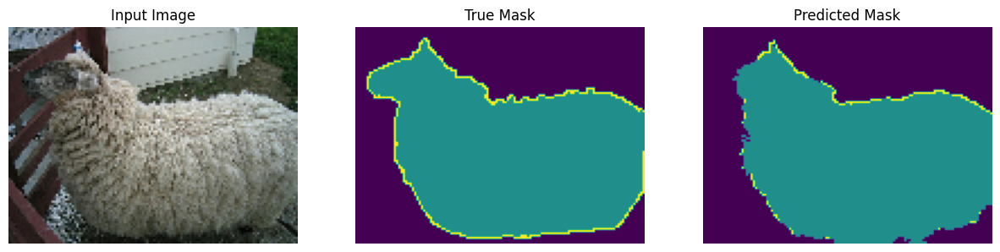

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


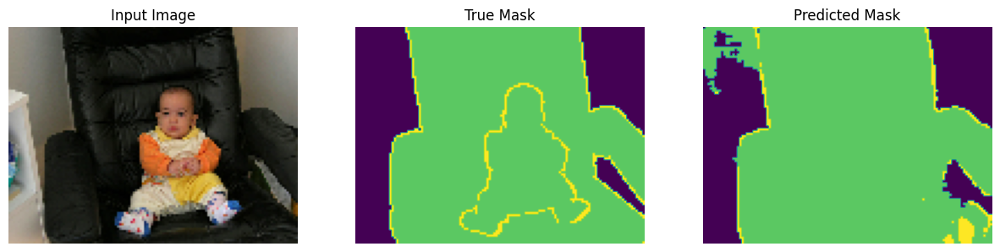

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


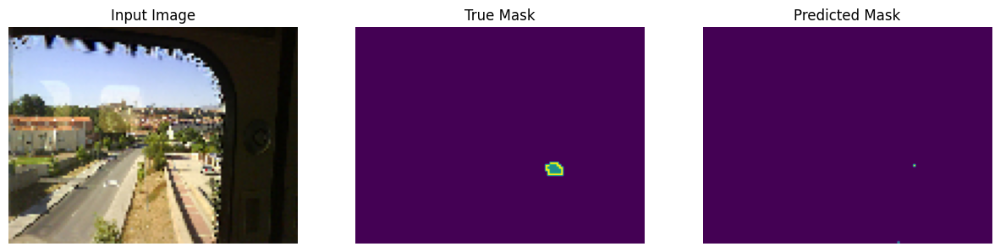

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


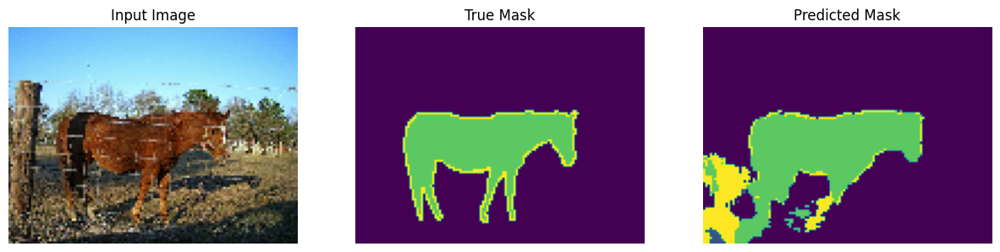

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step


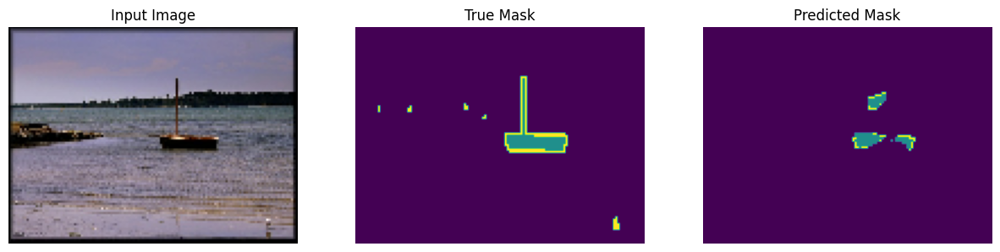

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


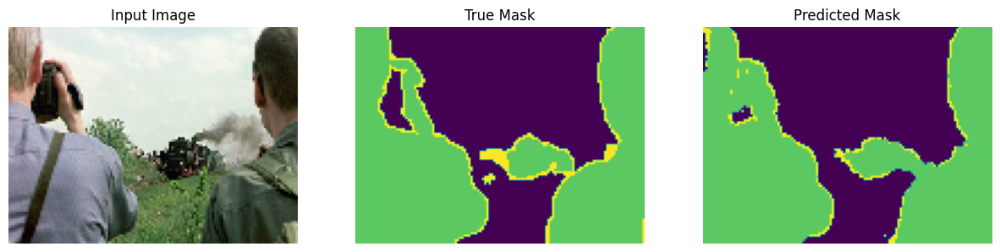

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


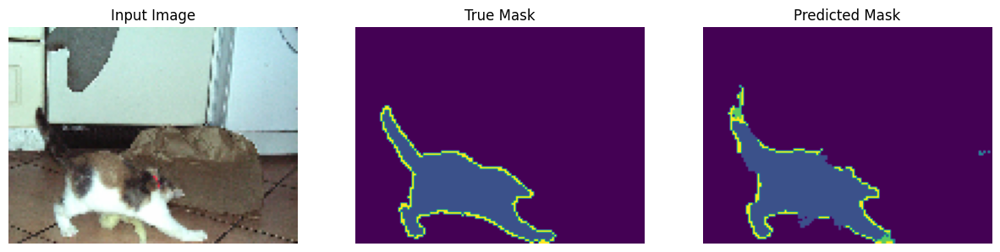

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


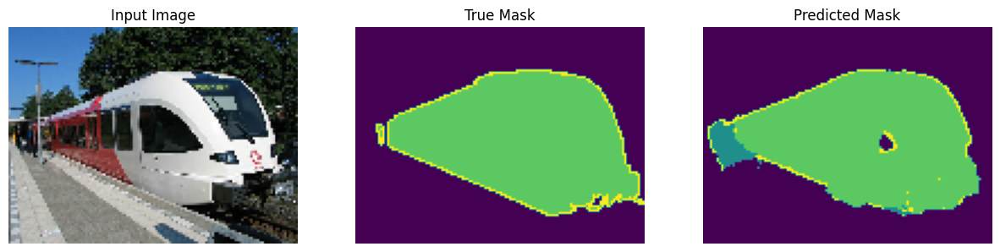

In [49]:
show_predictions(loaded_model_3,train_dataset, 30)

In [48]:
from tensorflow.keras.models import load_model

# Load the saved model
model = load_model(r'C:\Users\bhara\Desktop\AIAss\Segmentation\model5.keras')
